In [72]:
import os
import cv2
import math
import json
import glob
import random
import numpy as np
import pandas as pd
from PIL import Image
from matplotlib import pyplot as plt

random.seed(0)
# num_classes = 100
# colors = [(random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)) for _ in range(num_classes)]

VOC_CLASSES = [
    "background",
    "aeroplane",
    "bicycle",
    "bird",
    "boat",
    "bottle",
    "bus",
    "car",
    "cat",
    "chair",
    "cow",
    "diningtable",
    "dog",
    "horse",
    "motorbike",
    "person",
    "potted plant",
    "sheep",
    "sofa",
    "train",
    "tv/monitor",
]


VOC_COLORMAP = [
    [0, 0, 0],
    [128, 0, 0],
    [0, 128, 0],
    [128, 128, 0],
    [0, 0, 128],
    [128, 0, 128],
    [0, 128, 128],
    [128, 128, 128],
    [64, 0, 0],
    [192, 0, 0],
    [64, 128, 0],
    [192, 128, 0],
    [64, 0, 128],
    [192, 0, 128],
    [64, 128, 128],
    [192, 128, 128],
    [0, 64, 0],
    [128, 64, 0],
    [0, 192, 0],
    [128, 192, 0],
    [0, 64, 128],
]

num_classes = len(VOC_CLASSES)
colors = VOC_COLORMAP

In [73]:
# show org image
def display_img(paths):
    if type(paths) is str:
        paths = [paths]
        
    for path in paths:
        img = cv2.imread(path) # this is the annotation
        plt.imshow(img)
        plt.show()
        
        
# color seg and show 
def display_color_seg(paths):
    if type(paths) is str:
        paths = [paths]
        
    for path in paths:
        img = cv2.imread(path) # this is the annotation
        try:
            for i in range(len(colors)):
                img[:,:,0][np.where(img[:,:,0] == i)] = colors[i][0]
                img[:,:,1][np.where(img[:,:,1] == i)] = colors[i][1]
                img[:,:,2][np.where(img[:,:,2] == i)] = colors[i][2]
            
            plt.imshow(img)
            plt.show()
        except:
            pass
        
# get classes list from image path        
def get_classes_names(path, class_names):
    gray = cv2.imread(path, 0)
    # gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    ret_list = []
    for i in np.unique(gray): ret_list.append(class_names[i])
    return ret_list

def color_image(path, colors):
    img = cv2.imread(path)
    for i in range(len(colors)):
        img[:,:,0][np.where(img[:,:,0] == i)] = colors[i][0]
        img[:,:,1][np.where(img[:,:,1] == i)] = colors[i][1]
        img[:,:,2][np.where(img[:,:,2] == i)] = colors[i][2]
    return img

# resize img to dsize (shape[1], shape[0])
def reszie_img(img, dsize):
    # dsize = (int(labeled_img.shape[1]), int(labeled_img.shape[0]))
    return cv2.resize(img, dsize)
    
def transparent_overlays(image, annotation, alpha=0.5):
    img1 = image.copy()
    img2 = annotation.copy()

    # I want to put logo on top-left corner, So I create a ROI
    rows,cols,channels = img2.shape
    roi = img1[0:rows, 0:cols ]

    # Now create a mask of logo and create its inverse mask also
    img2gray = cv2.cvtColor(img2,cv2.COLOR_BGR2GRAY)
    ret, mask = cv2.threshold(img2gray, 10, 255, cv2.THRESH_BINARY)
    mask_inv = cv2.bitwise_not(mask)

    # Now black-out the area of logo in ROI
    # img1_bg = cv2.bitwise_and(roi,roi,mask = mask_inv)

    # Take only region of logo from logo image.
    img2_fg = cv2.bitwise_and(img2,img2,mask = mask)

    # Put logo in ROI and modify the main image
    # dst = cv2.add(img1_bg, img2_fg)
    dst = cv2.addWeighted(image.copy(), 1-alpha, img2_fg, alpha, 0)
    img1[0:rows, 0:cols ] = dst
    return dst

# Display a pair of image and label
# resizing 
# 1. Resize seq unlabel image (easiest way)
def color(img, colors):
    for i in range(len(colors)):
        img[:,:,0][np.where(img[:,:,0] == i)] = colors[i][0]
        img[:,:,1][np.where(img[:,:,1] == i)] = colors[i][1]
        img[:,:,2][np.where(img[:,:,2] == i)] = colors[i][2]
    return img

def display_pair(data_line, color_map, resize='raw'):

    tmp_json = json.loads(data_line)

    labeled_img = cv2.imread(tmp_json['fpath_img'][0])
    labeled_img = cv2.cvtColor(labeled_img, cv2.COLOR_BGR2RGB)
    colored_seg = color_image(tmp_json['fpath_segm'][0], color_map)

    unlabeled_img = cv2.imread(tmp_json['fpath_img'][1])
    unlabeled_img = cv2.cvtColor(unlabeled_img, cv2.COLOR_BGR2RGB)
    
    seg2 = cv2.imread(tmp_json['fpath_segm'][1])
    seg2 = cv2.resize(seg2, (int(colored_seg.shape[1]), int(colored_seg.shape[0])))
    
    colored_seg2 = color(seg2, color_map)
        
    
    unlabeled_img_title = ''
    colored_seg2_title = ''
    if 'raw' in resize: 
        unlabeled_img = reszie_img(unlabeled_img, (int(labeled_img.shape[1]), int(labeled_img.shape[0])))
        unlabeled_img_title = "raw (resized)"
    elif 'anno' in resize: 
        colored_seg2 = reszie_img(colored_seg2, (int(unlabeled_img.shape[1]), int(unlabeled_img.shape[0])))
        unlabeled_img_title = "raw"
        colored_seg2_title = "reszied"

    fig, axs = plt.subplots(2, 3, figsize=(13, 7))
    axs[0][0].imshow(labeled_img)
    axs[0][0].set_title("labeled")
    
    axs[0][1].imshow(colored_seg)
    axs[0][2].imshow(transparent_overlays(labeled_img, colored_seg, 0.5))
    
    axs[1][0].imshow(unlabeled_img)
    axs[1][0].set_title(unlabeled_img_title)
    
    axs[1][1].imshow(colored_seg2)
    axs[1][1].set_title(colored_seg2_title)
    axs[1][2].imshow(transparent_overlays(unlabeled_img, colored_seg2, 0.5))
    plt.tight_layout()
    plt.show();

# show pairs orgs and seg
def display(start, end, data, colors, resize_type='raw'):
    for i in range(start, end):
        print("\nline: {}; classes: {}".format(i, get_classes_names(json.loads(data[i])['fpath_segm'][0], VOC_CLASSES)))
        #display_img(json.loads(data[i])['fpath_img'])
        #display_color_seg(json.loads(data[i])['fpath_segm'])
        display_pair(data[i], colors, resize=resize_type)

## Visualizing seq_odgt data
- Given a pair odgt file name 
- Randomly select lines and display images and annotaions

**NOTE: raw data is resized to match the labeled image and annotation**

In [53]:
# display_pair(data[5], colors)
# get_classes_names(json.loads(data[5])['fpath_segm'][0], VOC_CLASSES)

## *Observation*
Resized raw images in the sequence to match the label image and annotaion

### '../seqs_odgts/VOCpairs_1000.odgt'
1. Long seq
2. Wrong classes but relatively accurate for "person" and "tv/monitor" class.
3. 'chair', 'sofa' are accurate on image level, off on pixel level

### '../seqs_odgts/VOCpairs_1000FCM.odgt'
1. Short seq
2. Relatively accurate for "person" and "tv/monitor", some "pet" class. Ex: 500, 503
3. "bicycle", "tv/monitor" are very accurate on both image and pixel level
4. Mix "bird" and "aeroplane", because of large sky area
5. Large sky and sea BG is a problem. Ex: 1445, 

### '../seqs_odgts/VOCpairs_4096.odgt' (very bad)
1. Short seq (seems longer than 1000FCM)
2. "person" and "tv/monitor" class is not as good. Ex: 1820, 1954
3. "car" is relatively accurate
4. Same sky and sea problem
5. Somehow mix up "pet" with "tv/monitor". Ex: 2621, 2622, 2623...

### '../seqs_odgts/VOCpairs_FCM.odgt' (good)
1. Overall much better than everything above
2. Some strange images with similar color tone. Ex: 223, 224
3. Somehow the BG problem is not as bad

In [104]:
#filename = '../seqs_odgts/VOCpairs_1000.odgt'
#filename = '../data/bodyparts_csv/train_iou.6.7.8.9.odgt'
#filename = '../data/bodyparts_csv/train_iou.less_than.6.odgt'

filename = "../data/bodyparts_csv/train_iou.less_than.6_subsamples.odgt"


# filename = '../seqs_odgts/VOCpairs_1000FCM.odgt'
# filename = '../seqs_odgts/VOCpairs_4096.odgt'
# filename = '../seqs_odgts/VOCpairs_FCM.odgt'

with open(filename, 'r') as f:
    data = f.readlines()

{"fpath_img": ["/usb/seq_data_for_mit_code/d8510109.42.JPG", "/usb/seq_data_for_mit_code/9f400411.47.JPG"], "fpath_segm": ["/data/sara/semantic-segmentation-pytorch/all_body_part_annotations/d8510109.42.png", "/data/sara/semantic-segmentation-pytorch/all_body_part_annotations/9f400411.47.png"], "width": 600, "height": 400, "iou": 0.23914893617021277}


line: 3350; classes: ['background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus']


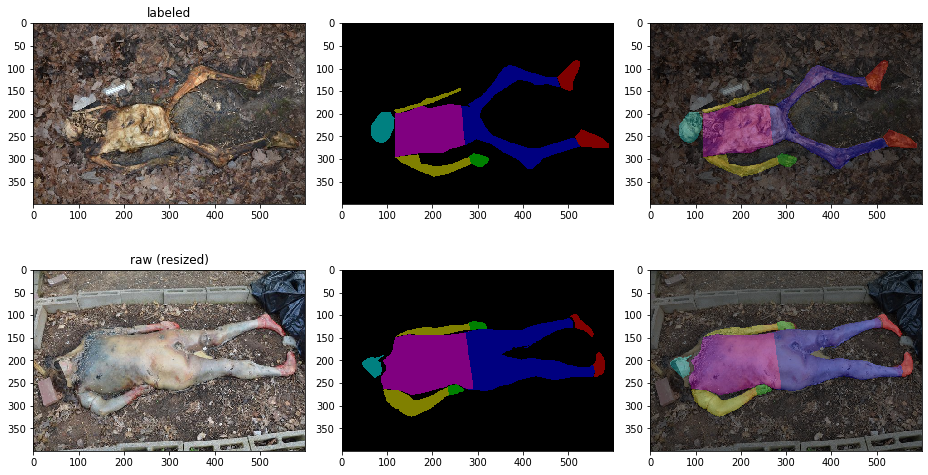


line: 3351; classes: ['background', 'bicycle', 'bird', 'boat', 'bottle', 'bus']


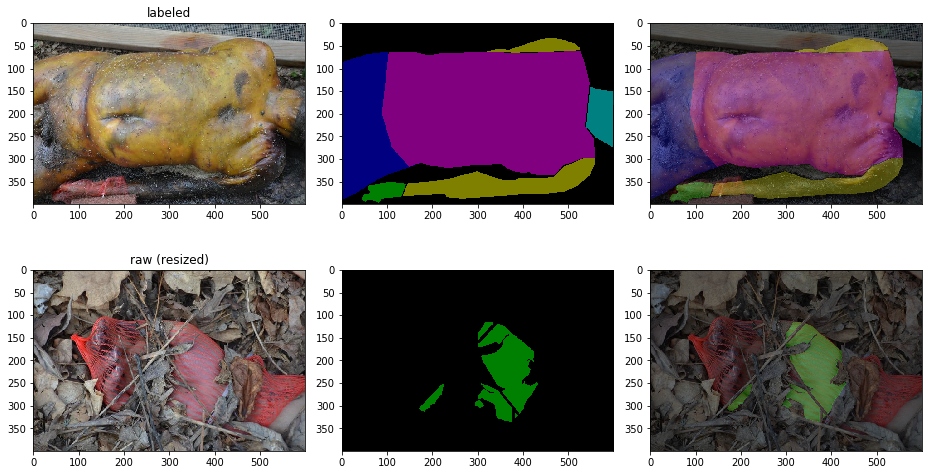


line: 3352; classes: ['background', 'bicycle', 'bird', 'boat', 'bottle', 'bus']


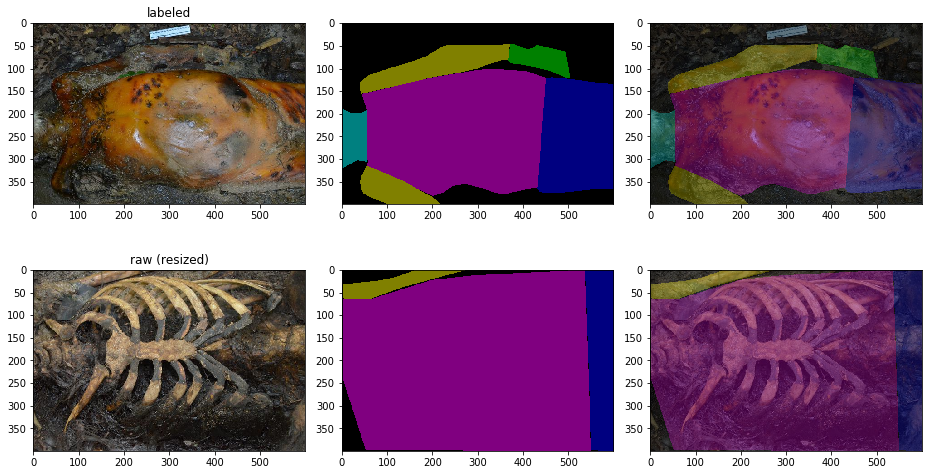


line: 3353; classes: ['background', 'aeroplane', 'boat']


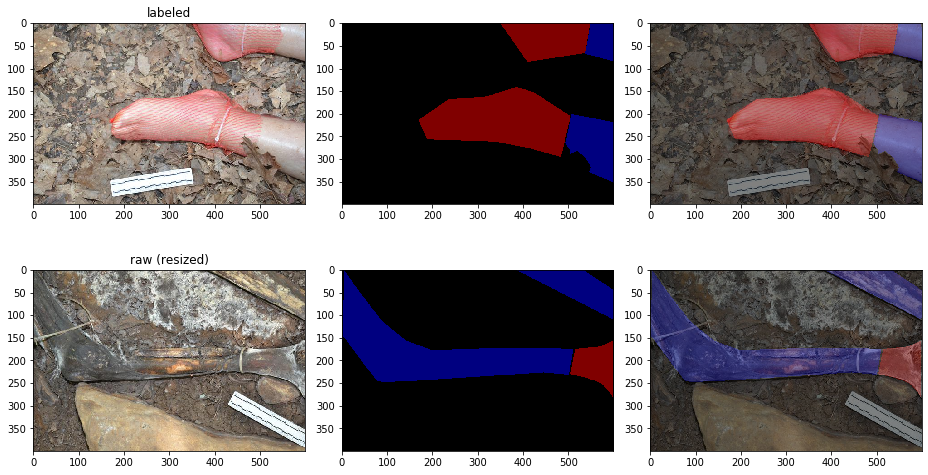


line: 3354; classes: ['background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus']


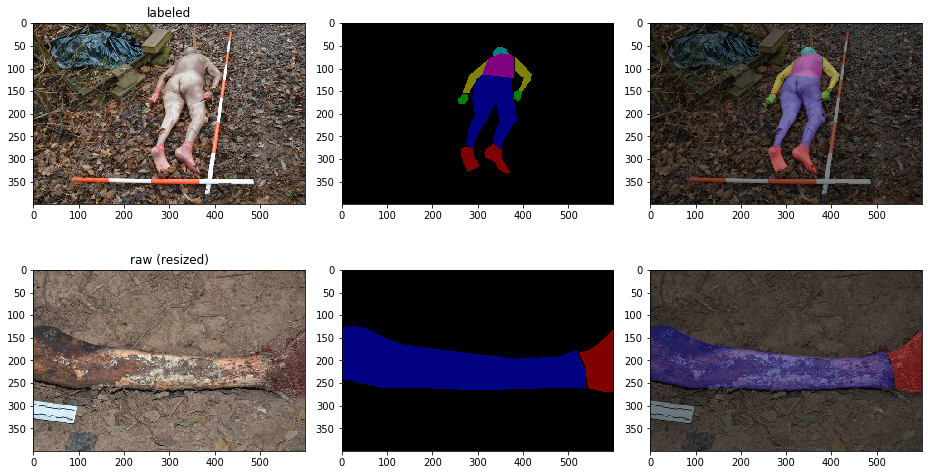

In [115]:
a = random.randint(0, len(data)-1)
# a = 10820
#a = 17449
print(data[a])
# print("classes: {}\n".format(get_classes_names(json.loads(data[a])['fpath_segm'][0], VOC_CLASSES)))
display(a, a+5, data, colors)
# display(a, a+2, data, colors, 'anno')

In [110]:
data[7736]

'{"fpath_img": ["/usb/seq_data_for_mit_code/13c00111.25.JPG", "/usb/seq_data_for_mit_code/9f400521.32.JPG"], "fpath_segm": ["/data/sara/semantic-segmentation-pytorch/all_body_part_annotations/13c00111.25.png", "/data/sara/semantic-segmentation-pytorch/all_body_part_annotations/9f400521.32.png"], "width": 600, "height": 400, "iou": 0.45121816960796185}\n'

## Displaying Full Sequence

In [34]:
# instead of displaying random image, this will get the entire sequence for a labeled image

def get_unique_label_img(data):
    all_label_img = []
    for val in data:
        all_label_img.append(json.loads(val)['fpath_img'][0])
    all_label_img = list(set(all_label_img))
    return all_label_img

# get a seq for a label image 
def get_a_seq(data, label_img):
    a_seq_data = []
    for val in data:
        if label_img in val:
            a_seq_data.append(val)
            # raw_img = json.loads(val)['fpath_img'][1]
    return a_seq_data

In [35]:
all_label_img = get_unique_label_img(data)
sub_data = get_a_seq(data, all_label_img[10])

numbers of image: 26

line: 0; classes: ['background', 'car']


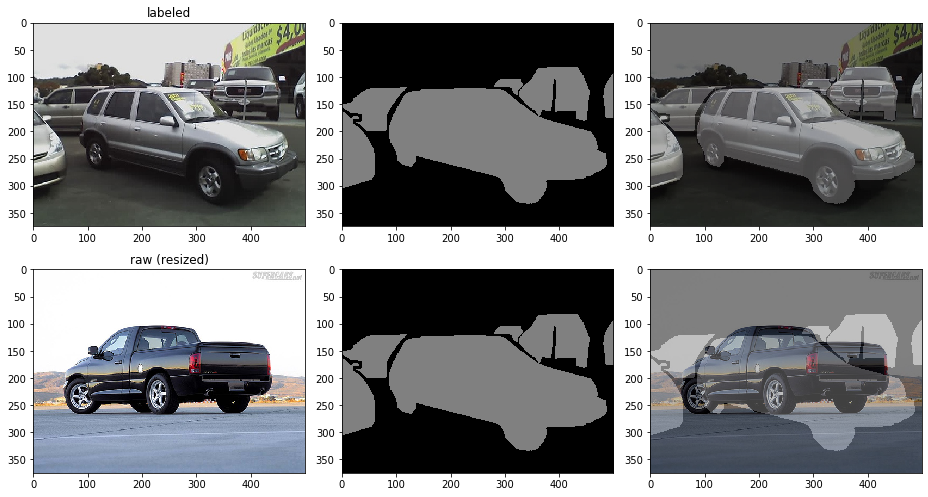


line: 1; classes: ['background', 'car']


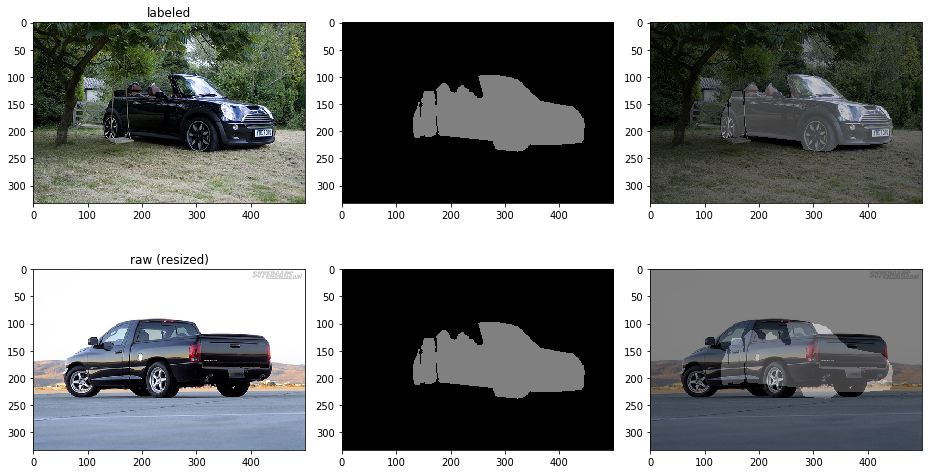


line: 2; classes: ['background', 'car']


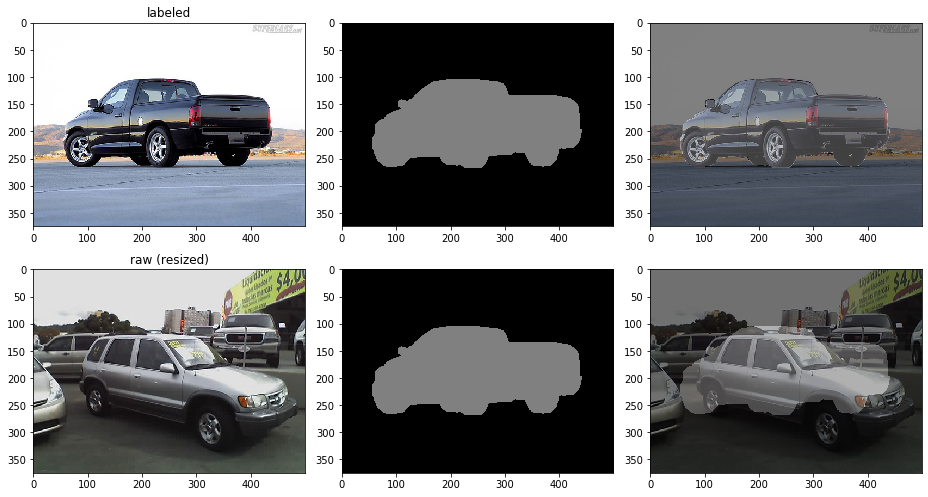


line: 3; classes: ['background', 'car']


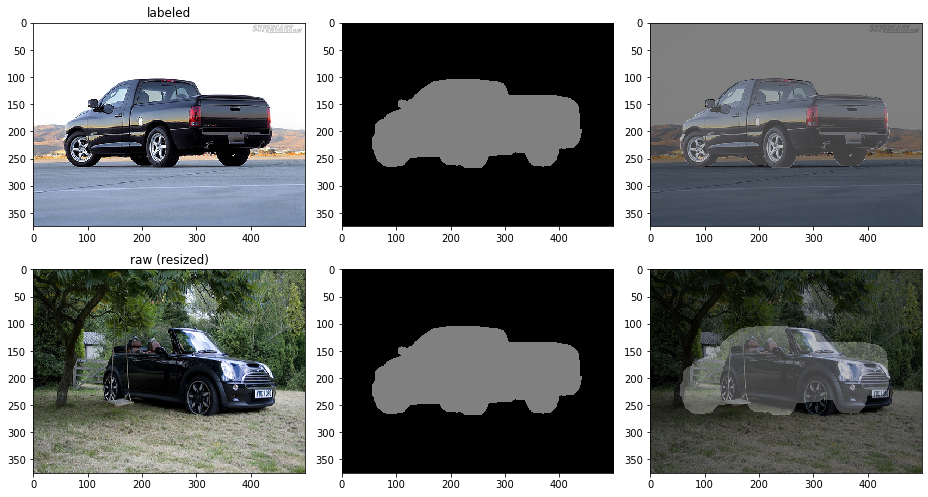


line: 4; classes: ['background', 'car']


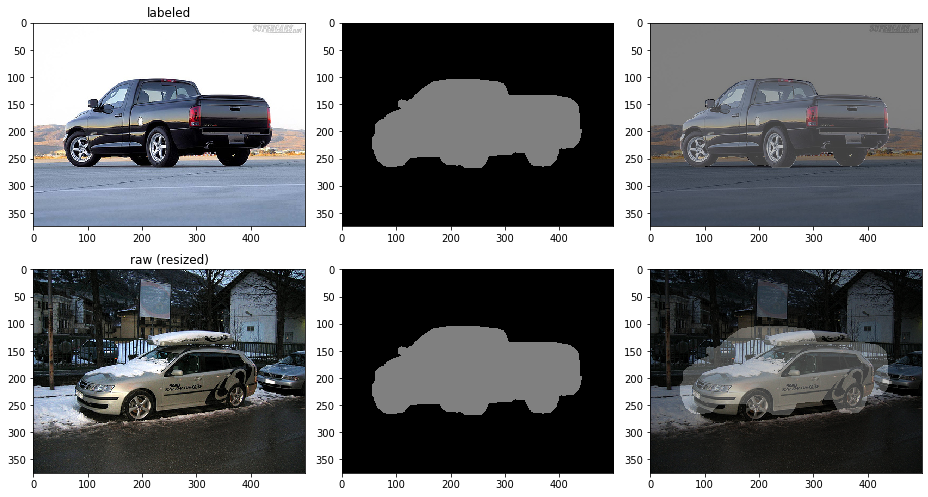


line: 5; classes: ['background', 'car']


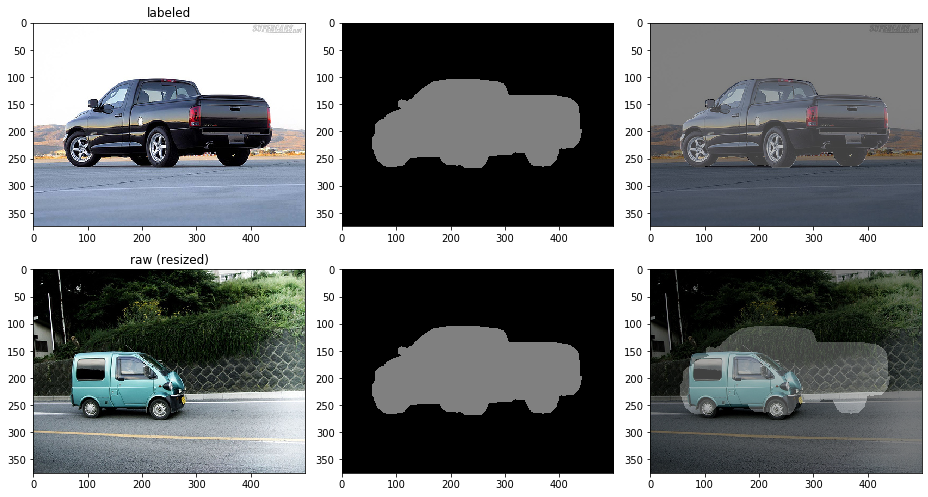


line: 6; classes: ['background', 'car']


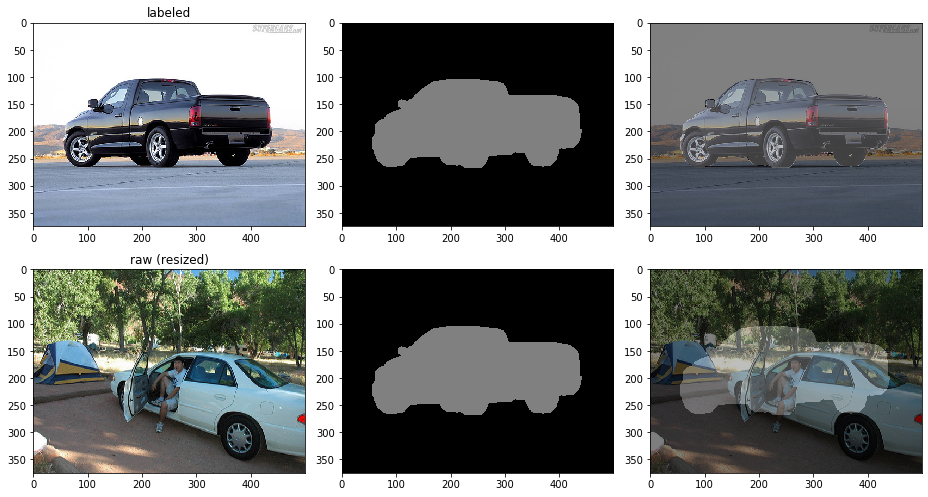


line: 7; classes: ['background', 'car']


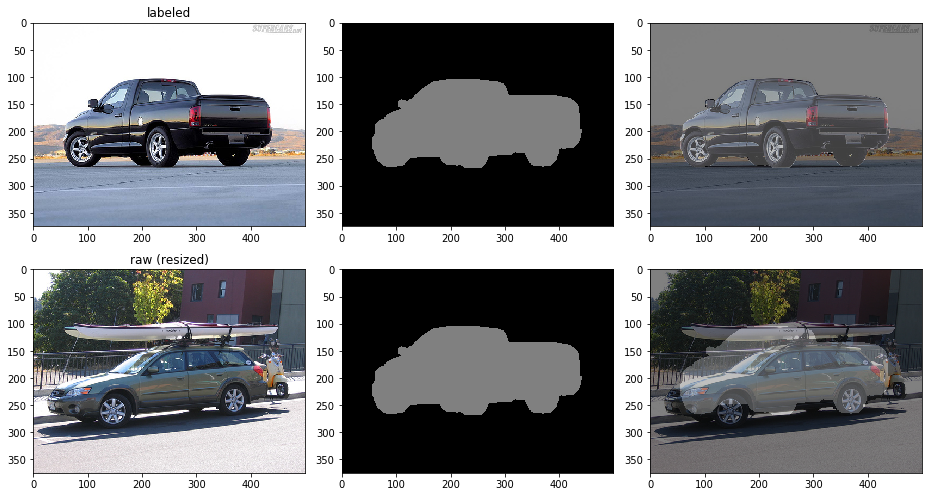


line: 8; classes: ['background', 'car']


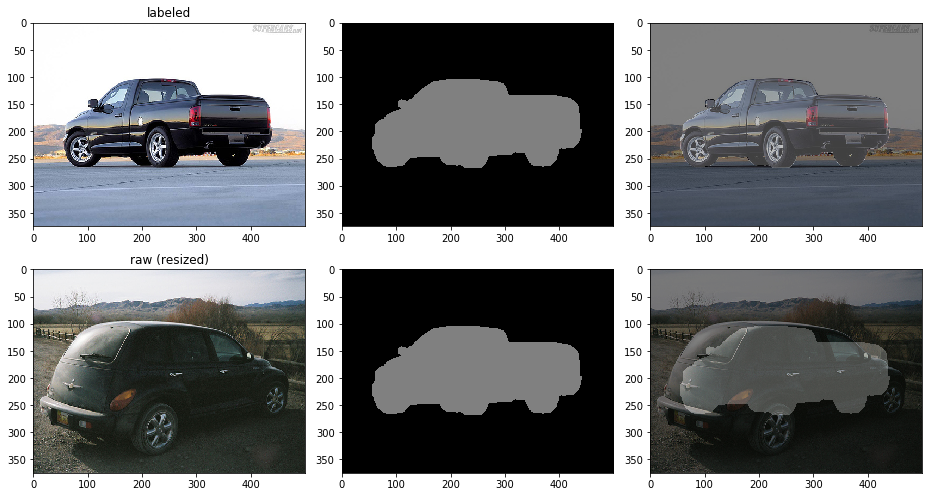


line: 9; classes: ['background', 'car']


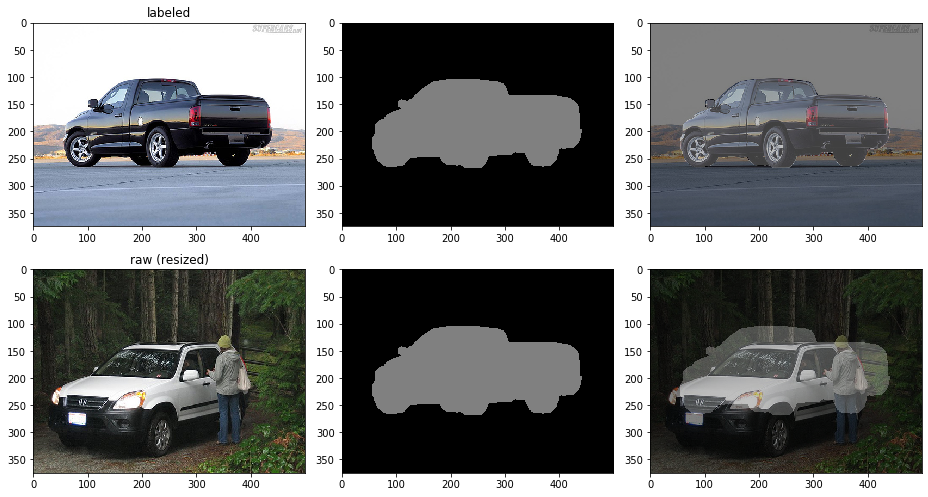


line: 10; classes: ['background', 'car']


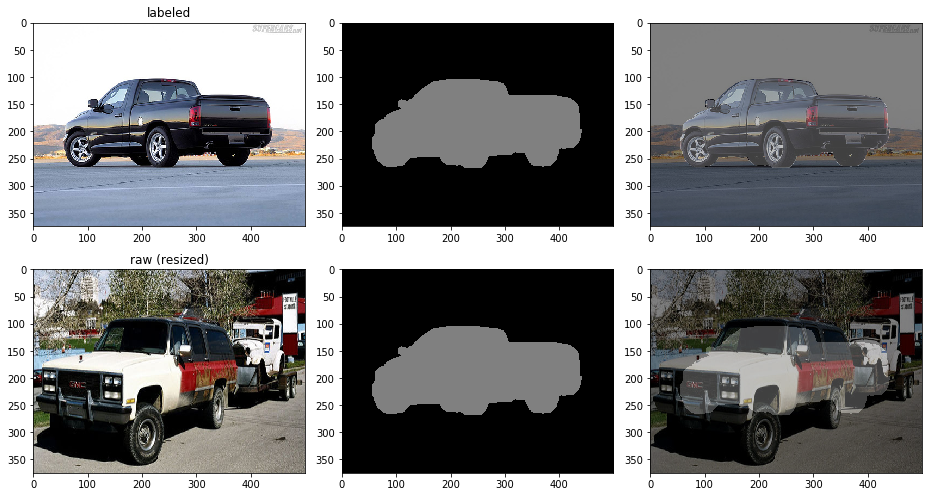


line: 11; classes: ['background', 'car']


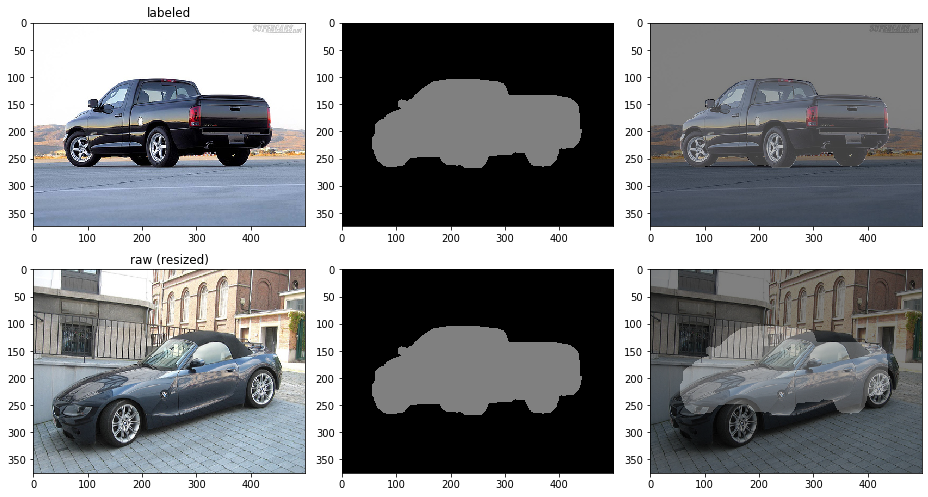


line: 12; classes: ['background', 'car']


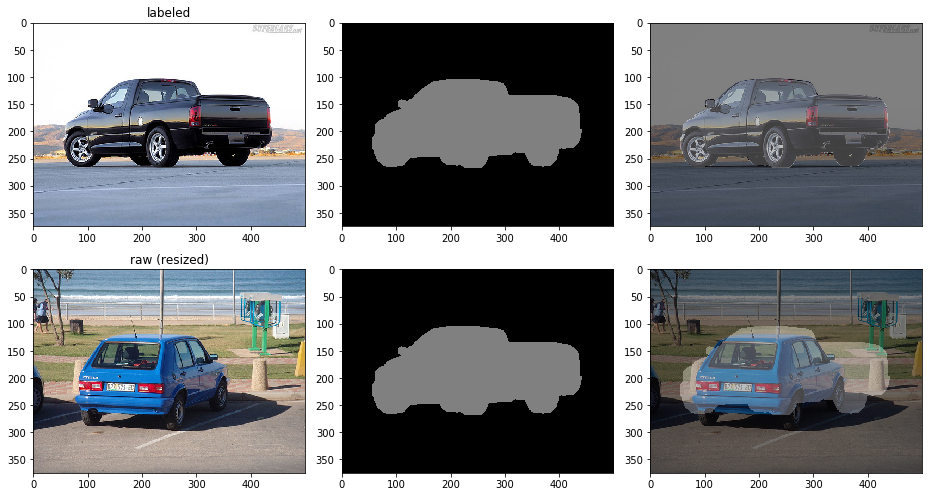


line: 13; classes: ['background', 'car']


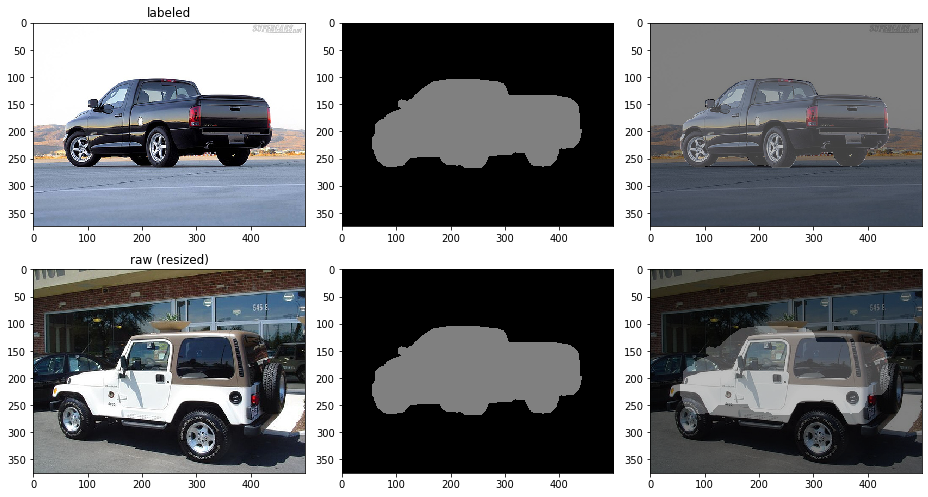


line: 14; classes: ['background', 'car']


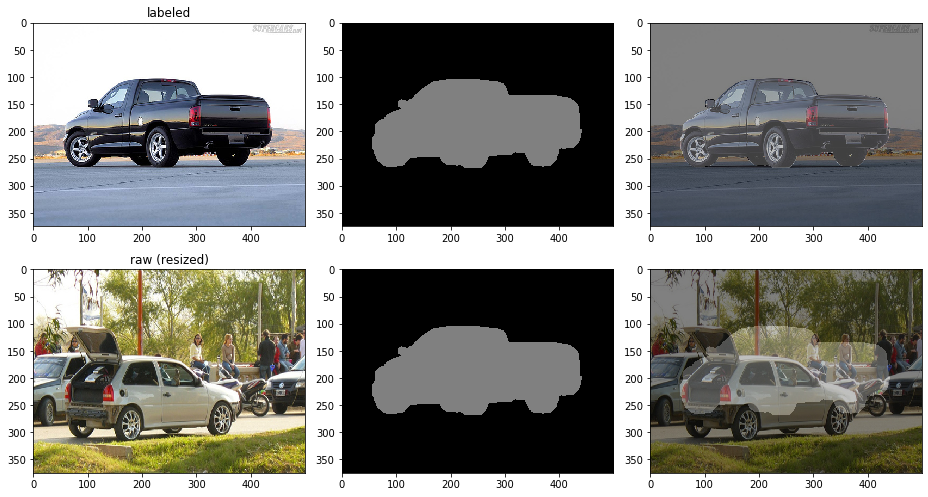


line: 15; classes: ['background', 'car']


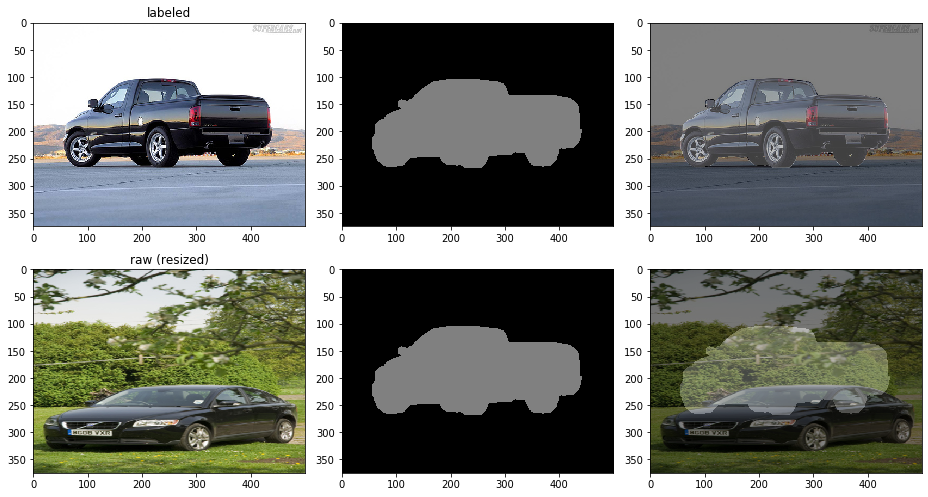


line: 16; classes: ['background', 'car']


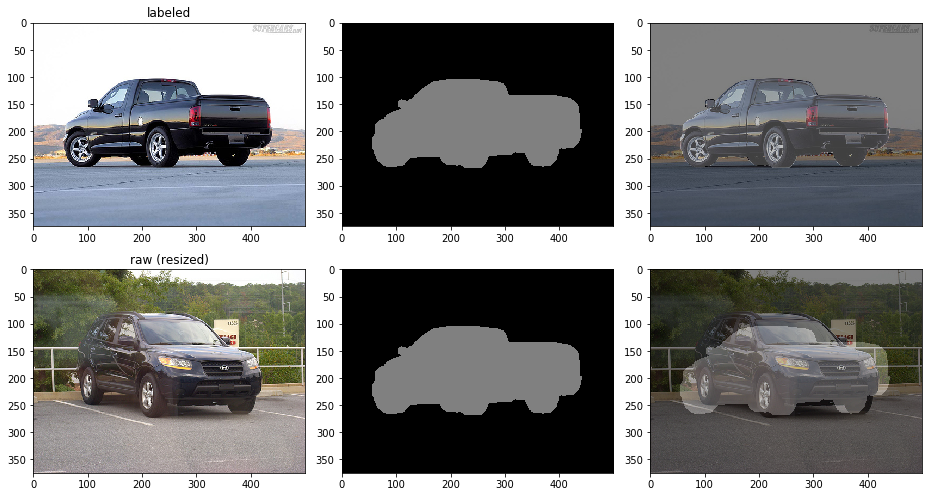


line: 17; classes: ['background', 'car']


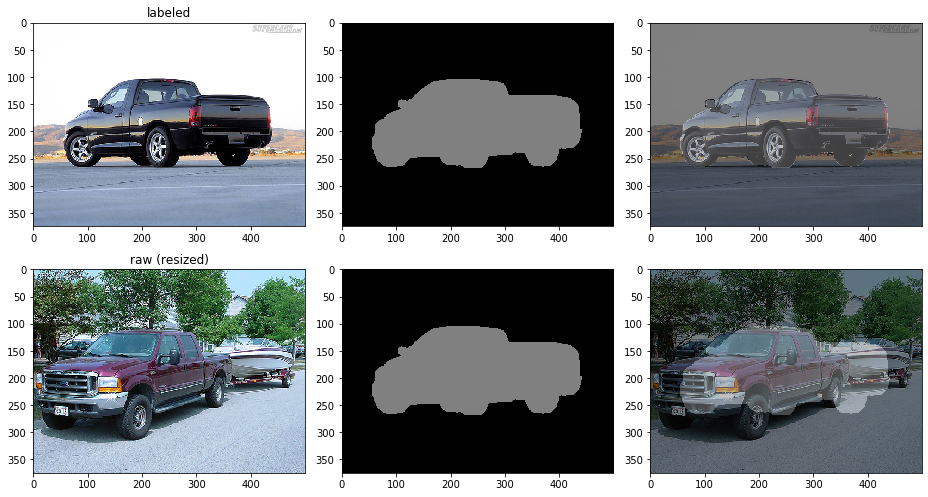


line: 18; classes: ['background', 'car']


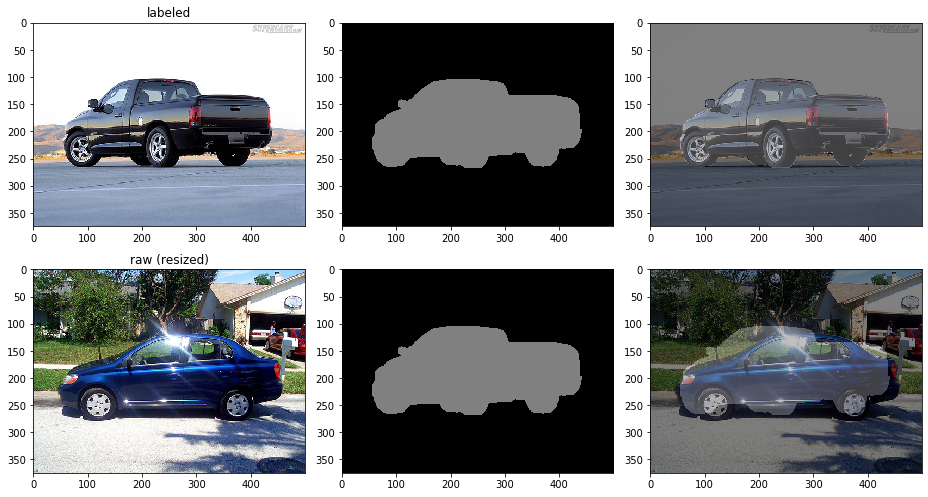


line: 19; classes: ['background', 'car']


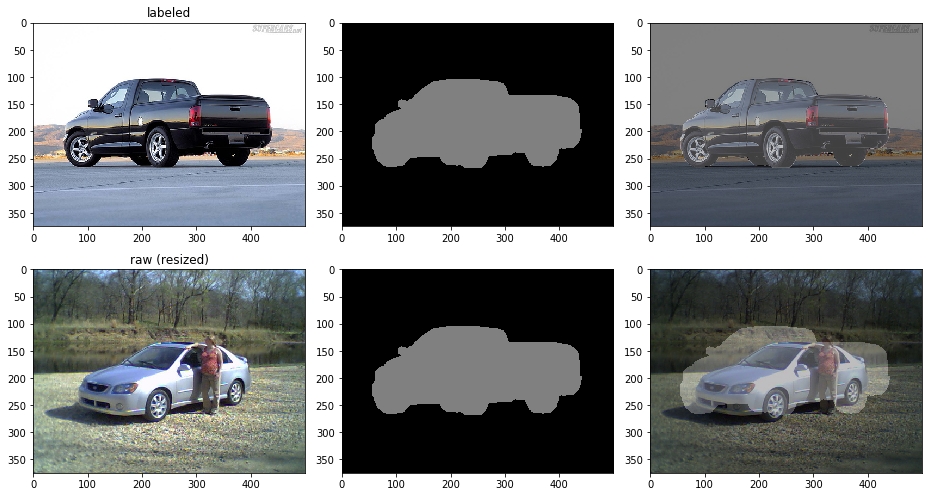


line: 20; classes: ['background', 'car']


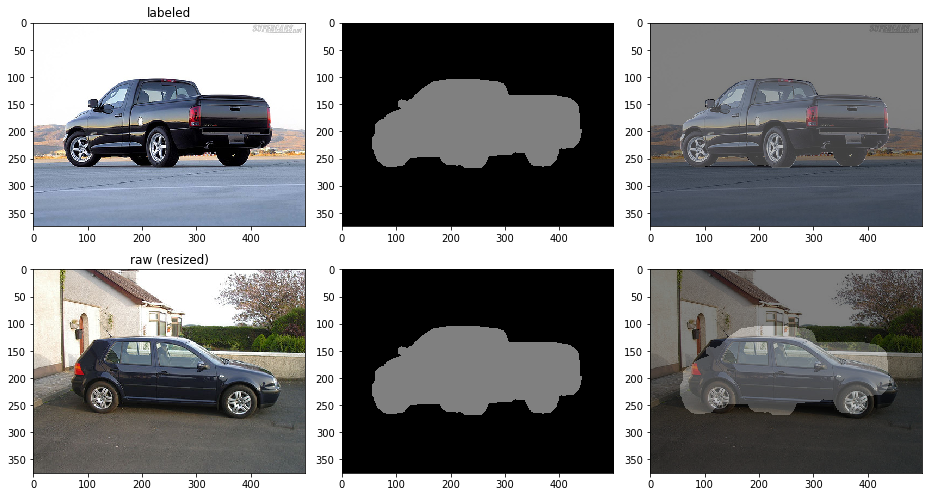


line: 21; classes: ['background', 'car']


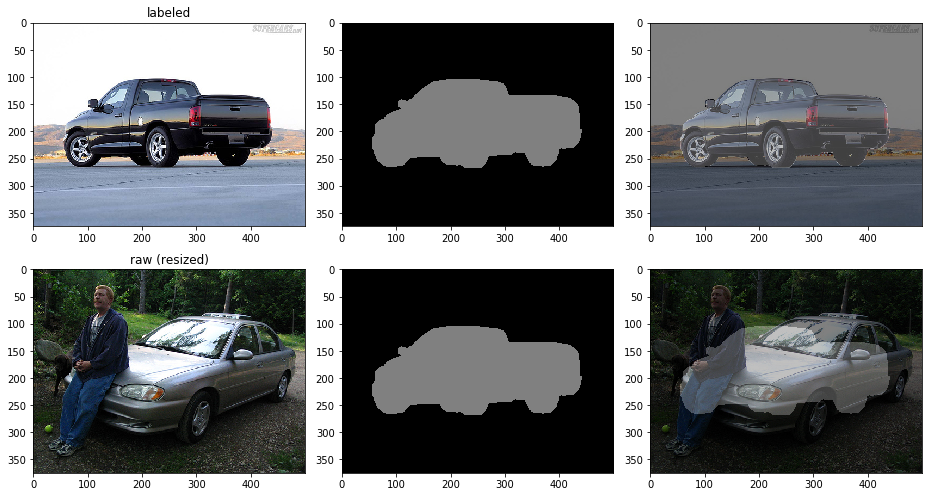


line: 22; classes: ['background', 'car']


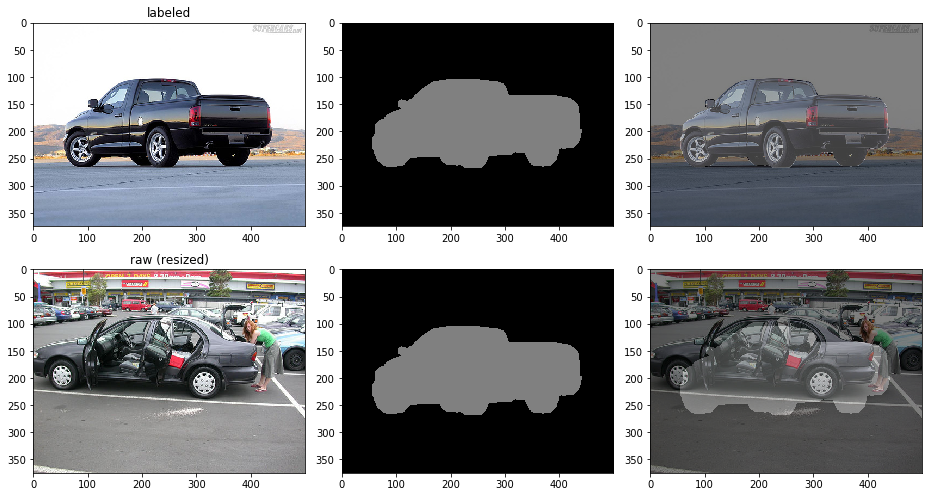


line: 23; classes: ['background', 'car']


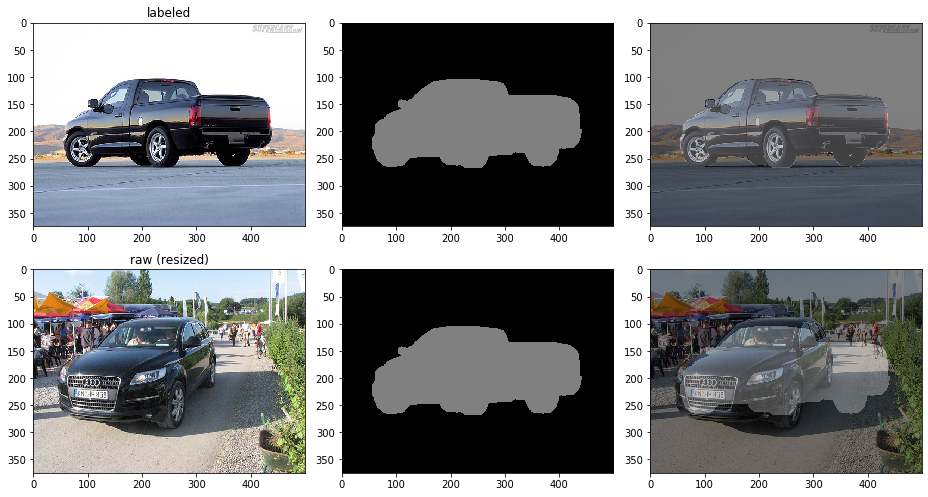


line: 24; classes: ['background', 'car']


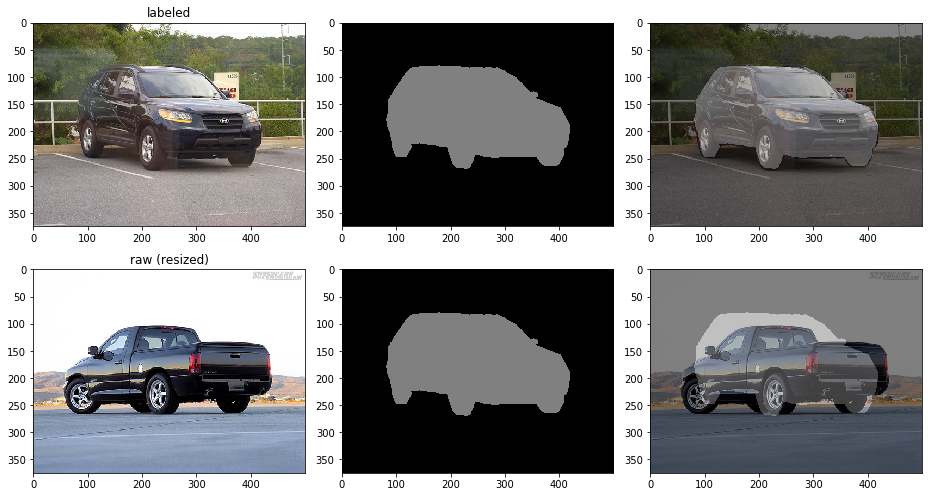


line: 25; classes: ['background', 'boat', 'car', 'person']


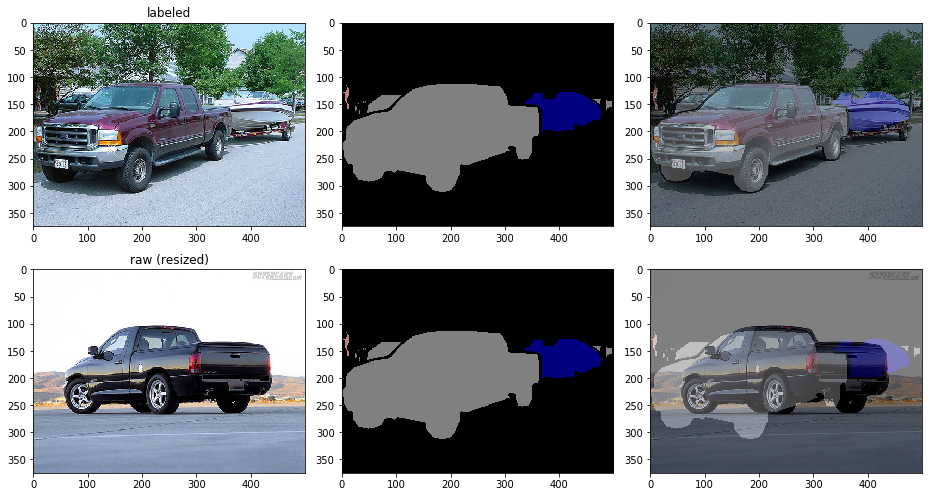

In [36]:
print("numbers of image: {}".format(len(sub_data)))
display(0, len(sub_data), sub_data, colors)

In [38]:
sub_data[0]

'{"fpath_img": ["/data/sara/semantic-segmentation-pytorch/datasets/VOC/train_and_unlabeled_imgs/VOCallMinusVal/2007_006900.jpg", "/data/sara/semantic-segmentation-pytorch/datasets/VOC/train_and_unlabeled_imgs/VOCallMinusVal/2008_004112.jpg"], "fpath_segm": ["/data/sara/semantic-segmentation-pytorch/datasets/VOC/train_labels/2007_006900.png", "/data/sara/semantic-segmentation-pytorch/datasets/VOC/train_labels/2007_006900.png"], "width": 375, "height": 500}\n'

### Resize Annotations

In [ ]:
a = random.randint(0, len(data)-1)
# display(a, a+3, data, colors, 'anno')

## Visualizing VOC Clusters

In [ ]:
def get_cluster(cluster, df, images_per_row=5):
    matches = df[df['cluster_name'] == cluster].reset_index()
    match_count = matches.shape[0]
    if match_count > 1:
        #fig, axarr = plt.subplots(1, match_count, figsize=(15,10))
        fig, axarr = plt.subplots(math.ceil(match_count/images_per_row), images_per_row, figsize=(15,12))
        plt.title = "cluster: " + cluster
        
        row_index = -1
        print("Numbers of images: {}\n".format(match_count))
        for index, row in matches.iterrows():
            img = cv2.imread(row['path'])
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            if index%images_per_row==0: 
                row_index+=1
            #axarr[index-1].imshow(img)
            #print(index, row_index, (index)%images_per_row)
            axarr[row_index][(index)%images_per_row].imshow(img)
            axarr[row_index][(index)%images_per_row].set_title("index: {}".format(index))
            
            
        for i in range(index%images_per_row+1, images_per_row): fig.delaxes(axarr[row_index][i])
        plt.tight_layout()
        plt.show()
    else:
        print(f"Cluster {cluster} has only one item")

In [ ]:
file_name = '../clustering/VOCallMinusVal1000'
df = pd.read_csv(file_name, sep=":", names=['path', 'cluster_name'])
cluster_names = df['cluster_name'].unique()

In [ ]:
rand_index = random.randint(0, len(cluster_names) - 1)
get_cluster(cluster_names[rand_index], df, 3)